In [1]:
import pandas as pd
from bifacial_peak_shaving import *
from utils import *
pd.options.plotting.backend='plotly'

# Data

In [2]:
dir = './Data/'

## Load

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 8760 entries, 1900-01-01 00:00:00 to 1900-12-31 23:00:00
Freq: H
Data columns (total 1 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Load (kW)  8760 non-null   float64
dtypes: float64(1)
memory usage: 136.9 KB
None


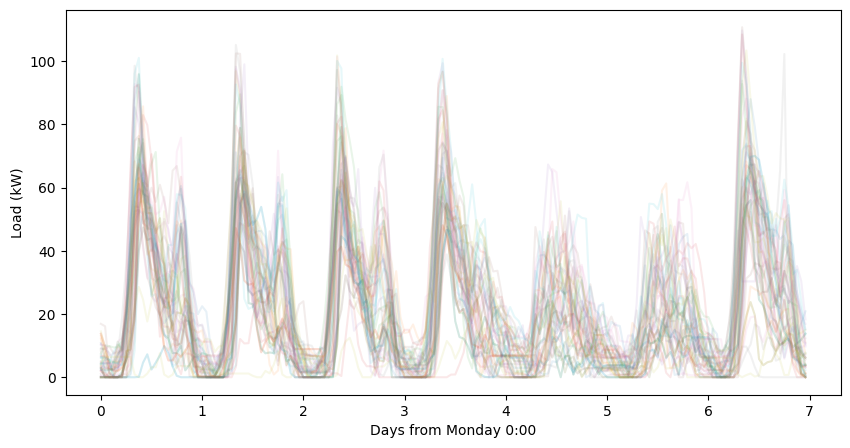

In [49]:
load = pd.read_csv(dir+'acn_caltech_profile_1y.csv',
                   #index_col=0,
                   #parse_dates=True,
                   comment='#',
                   usecols=[2],
                   )
                    #.resample('1h').mean()
                    #.fillna(method='ffill')
                    #.loc['2018-4-26':'2019-3-22']
#load = pd.DataFrame({'Load (kW)':list(load.loc['2019-1-2 0:00':'2019-1-2 16:00','Load (kW)'])+list(load.loc[:,'Load (kW)'])},
#                     index=pd.date_range('2019-1-1 0:00',periods=8760,freq='1h'))
#load.loc['2019-5-20'] = load.loc['2019-5-22'].values
#load.loc['2019-5-21'] = load.loc['2019-5-22'].values
load.index = pd.date_range('1900-1-1 0:00',periods=35040,freq='15min')
load = load.resample('1h').mean()
print(load.info())
plot_weekly(load['Load (kW)'])

## Solar

- 7 kWp, TMY

- Net zero capacity

  - $capacity[kWp] = production[kWh] \times yield [\frac{kWh}{kWp}]^{-1}$

In [50]:
solar_angles = ['s20','w20','w90','s20w90']
solar = pd.concat(( 
                    pd.read_csv(dir+'Solar/Modelled/lemooreCA_7kwp_s20deg.csv',index_col=0),
                    pd.read_csv(dir+'Solar/Modelled/lemooreCA_7kwp_w20deg.csv',index_col=0),
                    pd.read_csv(dir+'Solar/Modelled/lemooreCA_7kwp_w90deg.csv',index_col=0),
                    pd.read_csv(dir+'Solar/Modelled/lemooreCA_3.5kwp_s20deg_3.5kwp_w90deg.csv',index_col=0),
                   ),
                  axis=1)
solar.index = pd.date_range('1900-1-1 0:00',periods=8760,freq='1h')
solar.columns = solar_angles
net_zero_capacity = load['Load (kW)'].sum() / (solar.s20.sum()/7) # load=production / yield
solar = solar * net_zero_capacity/7 # scale to net 0
#solar = solar * 2 # randomly scale up
solar.describe()

,s20,w20,w90,s20w90
count,8760.000000,8760.000000,8760.000000,8760.000000
mean,19.913887,17.801734,19.045143,19.495684
std,28.116124,25.125326,25.036433,24.828871
min,-0.069281,-0.069281,-0.063140,-0.057946
25%,-0.008196,-0.008196,-0.008196,-0.008196
50%,-0.008196,-0.008196,-0.008196,-0.008196
75%,39.375306,34.899477,36.681002,42.021706
max,113.619475,109.463243,95.927687,88.275993


In [6]:
# for col in solar:
#     plot_daily(solar[col],title=col,interval_min=60)

## Plot weekly

In [51]:
solar.index = load.index
df = pd.concat((load,solar),axis=1)
df.columns = ['load'] + ['solar_'+x for x in solar.columns]
for angle in solar.columns:
    df[f'netload_{angle}'] = df['load'] - solar[angle]
df    

,load,solar_s20,solar_w20,solar_w90,solar_s20w90,netload_s20,netload_w20,netload_w90,netload_s20w90
1900-01-01 00:00:00,6.234351,-0.008196,-0.008196,-0.008196,-0.008196,6.242546,6.242546,6.242546,6.242546
1900-01-01 01:00:00,6.234351,-0.008196,-0.008196,-0.008196,-0.008196,6.242546,6.242546,6.242546,6.242546
1900-01-01 02:00:00,5.507010,-0.008196,-0.008196,-0.008196,-0.008196,5.515206,5.515206,5.515206,5.515206
1900-01-01 03:00:00,0.000000,-0.008196,-0.008196,-0.008196,-0.008196,0.008196,0.008196,0.008196,0.008196
1900-01-01 04:00:00,0.000000,-0.008196,-0.008196,-0.008196,-0.008196,0.008196,0.008196,0.008196,0.008196
...,...,...,...,...,...,...,...,...,...
1900-12-31 19:00:00,15.207377,-0.008196,-0.008196,-0.008196,-0.008196,15.215573,15.215573,15.215573,15.215573
1900-12-31 20:00:00,24.791792,-0.008196,-0.008196,-0.008196,-0.008196,24.799988,24.799988,24.799988,24.799988
1900-12-31 21:00:00,19.189889,-0.008196,-0.008196,-0.008196,-0.008196,19.198085,19.198085,19.198085,19.198085
1900-12-31 22:00:00,6.357917,-0.008196,-0.008196,-0.008196,-0.008196,6.366113,6.366113,6.366113,6.366113


load v s20

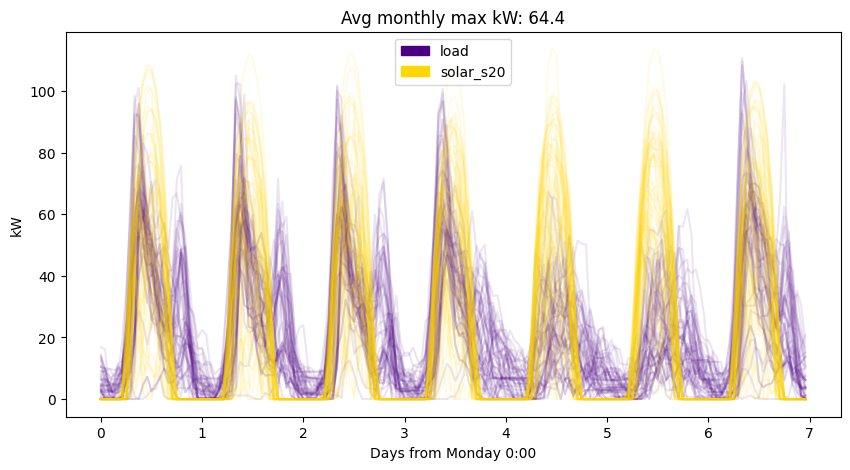

In [52]:
l = df['load']
s = df['solar_s20']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly((l,s),f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

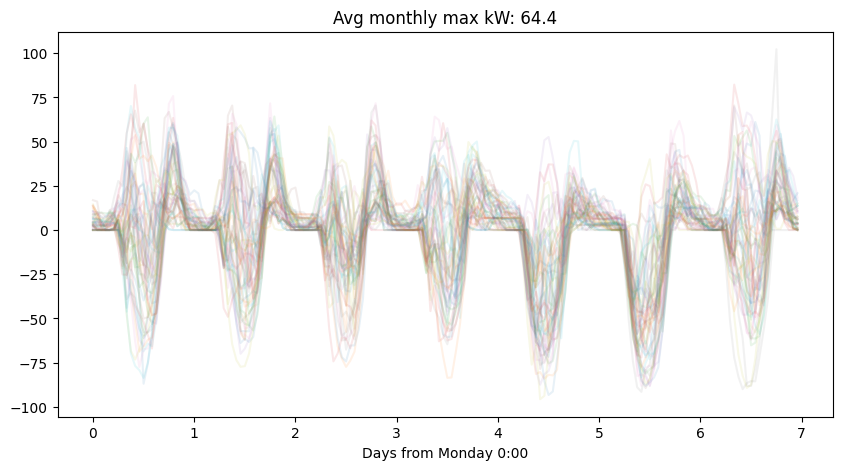

In [54]:
l = df['load']
s = df['solar_s20']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

load v w20

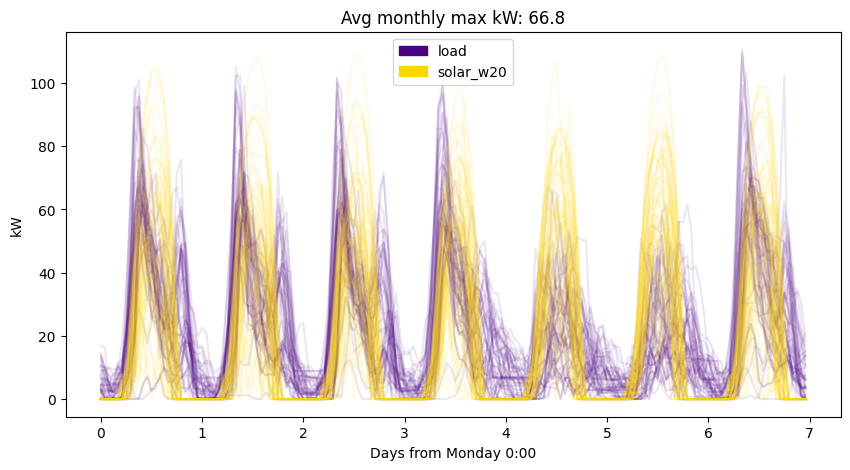

In [56]:
l = df['load']
s = df['solar_w20']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly((l,s),f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

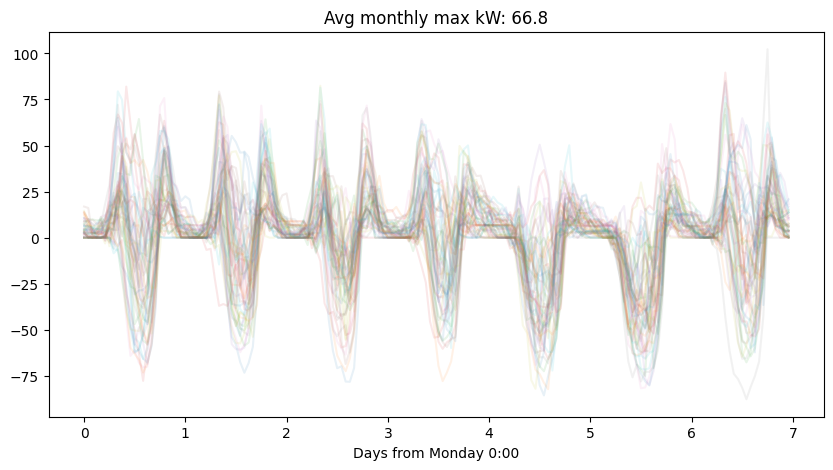

In [57]:
l = df['load']
s = df['solar_w20']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

load v w90

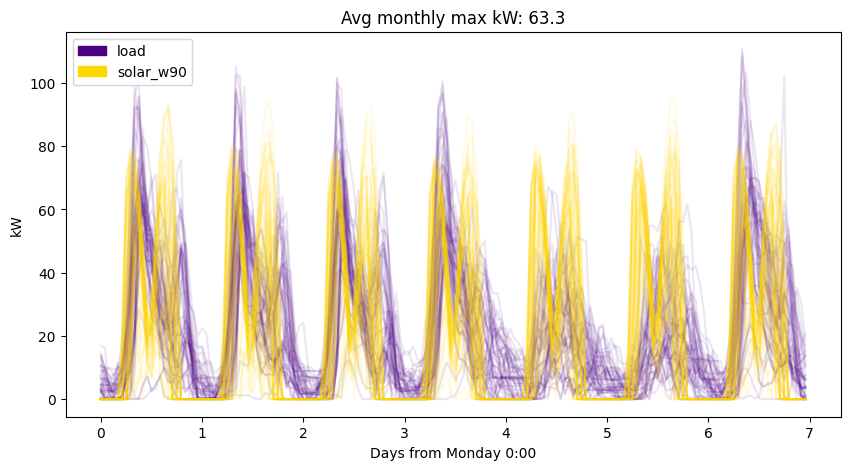

In [58]:
l = df['load']
s = df['solar_w90']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly((l,s),f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

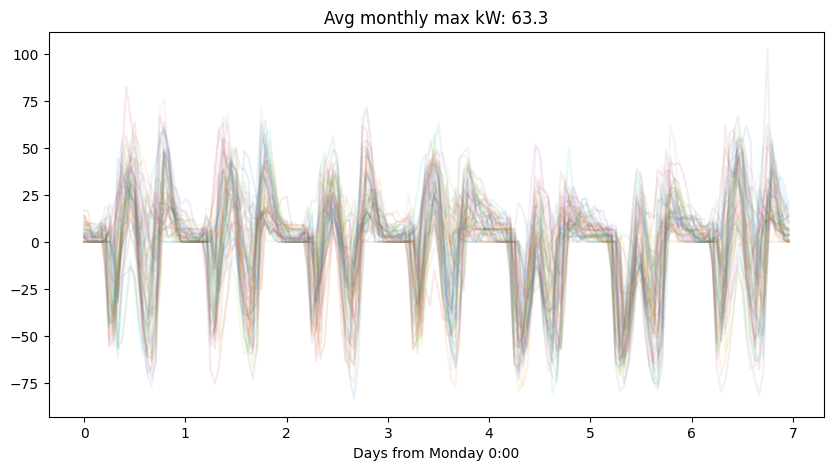

In [59]:
l = df['load']
s = df['solar_w90']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

load v s20w90

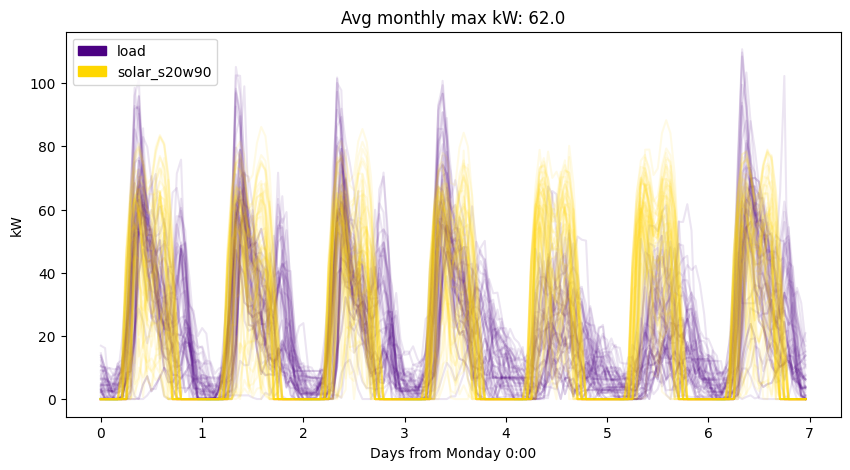

In [60]:
l = df['load']
s = df['solar_s20w90']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly((l,s),f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

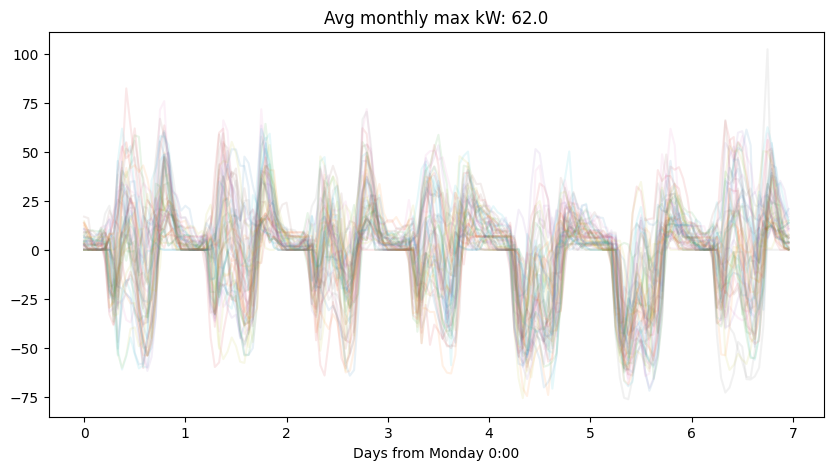

In [61]:
l = df['load']
s = df['solar_s20w90']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

# Monthly peaks

## Single TOU

In [62]:
peak_begin,peak_end = 8,11
angle = 's20'
peaks = calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)

angle = 'w20'
peaks = pd.concat((peaks,calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)),axis=1)
peaks[f'netload_s20->{angle} reduc kw'] = peaks['netload_s20 kw'] - peaks[f'netload_{angle} kw']

angle = 'w90'
peaks = pd.concat((peaks,calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)),axis=1)
peaks[f'netload_s20->{angle} reduc kw'] = peaks['netload_s20 kw'] - peaks[f'netload_{angle} kw']

angle = 's20w90'
peaks = pd.concat((peaks,calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)),axis=1)
peaks[f'netload_s20->{angle} reduc kw'] = peaks['netload_s20 kw'] - peaks[f'netload_{angle} kw']

print('Avg w20 reduction',peaks['netload_s20->w20 reduc kw'].mean())
print('Avg w90 reduction',peaks['netload_s20->w90 reduc kw'].mean())
print('Avg s20w90 reduction',peaks['netload_s20->s20w90 reduc kw'].mean())
peaks

Avg w20 reduction -3.433333333333334
Avg w90 reduction 4.175000000000001
Avg s20w90 reduction 3.6166666666666676


,netload_s20 kw,netload_s20 t,netload_w20 kw,netload_w20 t,netload_s20->w20 reduc kw,netload_w90 kw,netload_w90 t,netload_s20->w90 reduc kw,netload_s20w90 kw,netload_s20w90 t,netload_s20->s20w90 reduc kw
1,82.0,1900-01-22 10:00:00,82.0,1900-01-22 10:00:00,0.0,82.6,1900-01-22 10:00:00,-0.6,82.3,1900-01-22 10:00:00,-0.3
2,54.0,1900-02-06 09:00:00,54.0,1900-02-06 09:00:00,0.0,54.5,1900-02-06 09:00:00,-0.5,54.2,1900-02-06 09:00:00,-0.2
3,36.2,1900-03-14 09:00:00,48.1,1900-03-14 09:00:00,-11.9,29.8,1900-03-27 09:00:00,6.4,31.7,1900-03-14 09:00:00,4.5
4,58.4,1900-04-17 08:00:00,58.4,1900-04-17 08:00:00,0.0,59.2,1900-04-17 08:00:00,-0.8,58.8,1900-04-17 08:00:00,-0.4
5,43.5,1900-05-17 09:00:00,43.7,1900-05-17 09:00:00,-0.2,46.5,1900-05-17 09:00:00,-3.0,45.0,1900-05-17 09:00:00,-1.5
6,38.0,1900-06-14 10:00:00,39.8,1900-06-28 08:00:00,-1.8,43.4,1900-06-28 10:00:00,-5.4,38.7,1900-06-28 10:00:00,-0.7
7,64.1,1900-07-05 09:00:00,58.2,1900-07-05 10:00:00,5.9,47.1,1900-07-23 09:00:00,17.0,50.3,1900-07-05 10:00:00,13.8
8,82.3,1900-08-26 08:00:00,89.6,1900-08-26 08:00:00,-7.3,62.9,1900-08-21 09:00:00,19.4,65.6,1900-08-26 08:00:00,16.7
9,70.4,1900-09-09 08:00:00,85.0,1900-09-09 08:00:00,-14.6,61.8,1900-09-09 08:00:00,8.6,66.1,1900-09-09 08:00:00,4.3
10,70.1,1900-10-01 09:00:00,81.4,1900-10-03 08:00:00,-11.3,57.6,1900-10-14 10:00:00,12.5,61.8,1900-10-01 09:00:00,8.3


## Variable TOU

w20

In [63]:
angle1 = 's20'
angle2 = 'w20'

peak_reduc_v_TOU = net_load_peak_reduction_variable_TOU(df,angle1,angle2)
peak_reduc_v_TOU[peak_reduc_v_TOU['avg peak reduction [kW]']>4]

,TOU begin [h],TOU end [h],max peak reduction [kW],avg peak reduction [kW],min peak reduction [kW]
64,15,18,21.1,5.0,0.0
68,16,18,21.1,5.2,0.0


w90

In [64]:
angle1 = 's20'
angle2 = 'w90'

peak_reduc_v_TOU = net_load_peak_reduction_variable_TOU(df,angle1,angle2)
peak_reduc_v_TOU[peak_reduc_v_TOU['avg peak reduction [kW]']>4]

,TOU begin [h],TOU end [h],max peak reduction [kW],avg peak reduction [kW],min peak reduction [kW]
0,8,10,19.4,5.4,-3.0
1,8,11,19.4,4.2,-5.4
59,14,18,20.6,4.6,-1.7
60,14,19,31.4,4.4,-1.7
64,15,18,20.6,5.9,-0.8
65,15,19,31.4,5.0,-0.8
68,16,18,20.6,6.4,-0.8
69,16,19,31.4,5.3,0.0
72,17,19,31.4,4.6,0.0


s20w90

In [65]:
angle1 = 's20'
angle2 = 's20w90'

peak_reduc_v_TOU = net_load_peak_reduction_variable_TOU(df,angle1,angle2)
peak_reduc_v_TOU[peak_reduc_v_TOU['avg peak reduction [kW]']>4]

,TOU begin [h],TOU end [h],max peak reduction [kW],avg peak reduction [kW],min peak reduction [kW]
0,8,10,16.7,4.2,-1.5
64,15,18,19.7,5.1,-0.4
68,16,18,19.7,5.5,-0.4


Best for w90

In [21]:
#df.loc['2022-6-28':'2022-6-30'][['load','solar_s20','solar_w90','solar_s20w90']].plot()

In [22]:
#df.loc['2022-3-5':'2022-3-7'][['load','solar_s20','solar_w90','solar_s20w90']].plot()

Largest spread w90 v s20w90

In [23]:
#df.loc['2022-10-12':'2022-10-14'][['load','solar_s20','solar_w90','solar_s20w90']].plot()

# Peak shaving

## Technical

More or less technical peak shaving doesn't benefit from bifacial, I think because if you're trying to shave the entire day you benefit more from the greater kWh produced by s20 than any of the other angles.

### Single angle

In [67]:
threshold = 50
batt_kwh_max = 100
angle = 's20'
TOU_hours = list(range(24))

batt_kwh,dfps = find_smallest_soe0(df,
                                   f'netload_{angle}',
                                   threshold,
                                   batt_kwh_max,
                                   TOU_hours)

plotly_stacked(dfps,
               solar=f'solar_{angle}',
               title=f'Treshold kW = {threshold}, TOU = {TOU_hours[0]}-{TOU_hours[-1]}, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')

Solution found: netload_s20, Threshold kw = 50.0, Battery kWh = 88.0,


### Several angles

In [68]:
results = {'solar':[],'batt_kwh':[],'dfps':[]}
threshold = 50
batt_kwh_max = 100
TOU_hours = list(range(24))

for angle in ['s20','w20','w90','s20w90']:
    batt_kwh,dfps = find_smallest_soe0(df,
                              f'netload_{angle}',
                              threshold,
                              batt_kwh_max,
                              TOU_hours,)
    results['solar'].append(angle)
    results['batt_kwh'].append(batt_kwh)
    results['dfps'].append(dfps)
    
print('\n',pd.DataFrame(results).iloc[:,:2])

Solution found: netload_s20, Threshold kw = 50.0, Battery kWh = 88.0,
Solution found: netload_w20, Threshold kw = 50.0, Battery kWh = 90.0,
Solution found: netload_w90, Threshold kw = 50.0, Battery kWh = 60.0,
Solution found: netload_s20w90, Threshold kw = 50.0, Battery kWh = 68.0,

     solar  batt_kwh
0     s20        88
1     w20        90
2     w90        60
3  s20w90        68


s20

In [69]:
dfps = results['dfps'][0]
solar = results['solar'][0]
batt_kwh = results['batt_kwh'][0]
plotly_stacked(dfps,
               solar='solar_'+solar,
               title=f'Treshold kW = {threshold}, TOU = {TOU_hours[0]}-{TOU_hours[-1]}, '+\
                     f'Solar = {solar} <br>Battery kWh = {batt_kwh:.1f}')

w90

In [70]:
dfps = results['dfps'][2]
solar = results['solar'][2]
batt_kwh = results['batt_kwh'][2]
plotly_stacked(dfps,
               solar='solar_'+solar,
               title=f'Treshold kW = {threshold}, TOU = {TOU_hours[0]}-{TOU_hours[-1]}, '+\
                     f'Solar = {solar} <br>Battery kWh = {batt_kwh:.1f}')

## Economic

### Single angle

In [71]:
threshold = 25
batt_kwh_max = 100
angle = 's20'
TOU_hours = list(range(16,18))

batt_kwh,dfps = find_smallest_soe0(df,
                                   f'netload_{angle}',
                                   threshold,
                                   batt_kwh_max,
                                   TOU_hours,)

plotly_stacked(dfps,
               solar=f'solar_{angle}',
               title=f'Treshold kW = {threshold}, TOU = {TOU_hours[0]}-{TOU_hours[-1]}, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')

Solution found: netload_s20, Threshold kw = 25.0, Battery kWh = 52.0,


### Several angles

In [72]:
threshold = 25
batt_kwh_max = 100
TOU_hours = list(range(16,18))

results = {'solar':[],'batt_kwh':[],'dfps':[]}
for solar_angle in ['s20','w20','w90','s20w90']:
    df2 = df.copy(deep=True)
    batt_kwh,dfps = find_smallest_soe0(df,
                              f'netload_{solar_angle}',
                              threshold,
                              batt_kwh_max,
                              TOU_hours,)
    results['solar'].append(solar_angle)
    results['batt_kwh'].append(batt_kwh)
    results['dfps'].append(dfps)
    
print('\n',pd.DataFrame(results).iloc[:,:2])

Solution found: netload_s20, Threshold kw = 25.0, Battery kWh = 52.0,
Solution found: netload_w20, Threshold kw = 25.0, Battery kWh = 42.0,
Solution found: netload_w90, Threshold kw = 25.0, Battery kWh = 31.0,
Solution found: netload_s20w90, Threshold kw = 25.0, Battery kWh = 38.0,

     solar  batt_kwh
0     s20        52
1     w20        42
2     w90        31
3  s20w90        38


s20

In [73]:
dfps = results['dfps'][0]
solar = results['solar'][0]
batt_kwh = results['batt_kwh'][0]
plotly_stacked(dfps,
               solar='solar_'+solar,
               title=f'Treshold kW = {threshold}, TOU = {TOU_hours[0]}-{TOU_hours[-1]}, '+\
                     f'Solar = {solar} <br>Battery kWh = {batt_kwh:.1f}')

w90

In [74]:
dfps = results['dfps'][2]
solar = results['solar'][2]
batt_kwh = results['batt_kwh'][2]
plotly_stacked(dfps,
               solar='solar_'+solar,
               title=f'Treshold kW = {threshold}, TOU = {TOU_hours[0]}-{TOU_hours[-1]}, '+\
                     f'Solar = {solar} <br>Battery kWh = {batt_kwh:.1f}')